# **Synovium Hyperparameter search**

In this notebook I run the hyperparameter search for the downstream analysis of treatment differences in the synovium.


# **Imports**

In [1]:
# import the VAE code
import sys
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc
import scipy


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/davidnat/

In [2]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_synovium_data/"
bulk_aug_data_path = f"{os.getcwd()}/../data/bulk_data/synovium/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_synovium/"
clinical_file = f"{os.getcwd()}/../data/single_cell_data/synovium/metadata_clin_donor_singlecell.csv"


cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_synovium/"



cibersort_genes_path = (f"{os.getcwd()}/../results/single_cell_data/cibersort_synovium/" +
                        "CIBERSORTx_Job42_test_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job42_test_cybersort_sig_inferred_refsample.bm.K999.txt")

num_genes = 7000

exp_id = "all-synovium"
res_id = "rittoc-synovium"
curr_treatment = "Rituximab_Tocilizumab"

RETRAIN_MODELS = False
RUN_CIBERSORT_GENES = False
RUN_CIBERSORT_SAMPLES = False


# Set-up experimental variables

In [3]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 8

# number of patients/domains/samples expected
n_tot_samples = 23 # 16 bulk and 7 single cell samples -- Tocilizumab
n_tot_samples = 22 # 16 bulk and 6 single cell samples -- Tocilizumab
n_tot_samples = 27 # 16 bulk and 11 single cell samples -- Tocilizumab
n_tot_samples = 24 # 16 bulk and 8 single cell samples -- Tocilizumab
n_tot_samples = 147 # 139 bulk and 8 single cell samples -- Tocilizumab

# number of drugs (in this case sexes used for prediction)
# one-hot encoded
n_drugs = 3

# number of types of sequencing (one-hot encoded)
n_tech = 2


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [4]:
# get the info for CIBERSORT for generating the union_genes

if RUN_CIBERSORT_GENES:
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, "BRI-415", "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    # now we transpose
    pseudobulks_sparse = scipy.sparse.csr_matrix(pseudobulks_df.values)
    pseudobulks_sparse_t = pseudobulks_sparse.transpose()
    pseudobulks_df = pd.DataFrame.sparse.from_spmatrix(pseudobulks_sparse_t)
    pseudobulks_df.columns = range(pseudobulks_df.shape[1])

    # now write it out
    sc_preprocess.write_cs_bp_files(cibersort_path, exp_id, sig_df, pseudobulks_df)
    sig_samp_df = sig_df

    sig_df_vals = sig_samp_df.iloc[:,1:]
    sig_df_celltype = sig_samp_df.scpred_CellType

    # now we transpose
    sig_sparse = scipy.sparse.csr_matrix(sig_df_vals.values)
    sig_sparse_t = sig_sparse.transpose()
    sig_sparse = pd.DataFrame.sparse.from_spmatrix(sig_sparse_t)
    sig_sparse.columns = sig_df_celltype
    sig_sparse.index = sig_samp_df.columns[1:]

    sig_sparse = pd.DataFrame(sig_sparse)

    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_sig.tsv.gz")
    sig_out_path = Path(sig_out_file)
    sig_sparse = sig_sparse.astype('int')
    sig_sparse.to_csv(sig_out_path, sep='\t',header=True)

    # write out the bulk RNA-seq mixture matrix
    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_mix.tsv.gz")
    sig_out_path = Path(sig_out_file)

    pseudobulks_df.to_csv(sig_out_path, sep='\t',header=True)


In [5]:
in_name = f"synovium_bulk_processed_{curr_treatment}"


# read in the real bulk data
processed_sc_file = f"{bulk_aug_data_path}/{in_name}.h5ad"
adata = sc.read_h5ad(processed_sc_file)


# now get the sc ref training data

# read in order
# oritinal samples
sample_order = ['BRI-462', 'BRI-458', 'BRI-460', 'BRI-421',
                'BRI-515', 'BRI-415', 'BRI-436']

#nonimmune samples
sample_order = ['BRI-460', 'BRI-462', 'BRI-515', 'BRI-601', 'BRI-605']
#immune samples
sample_order = ['BRI-415', 'BRI-421', 'BRI-436', 'BRI-458', 'BRI-566', 'BRI-623']

# all samples
sample_order = ['BRI-415', 'BRI-421', 'BRI-436', 'BRI-458', 'BRI-566', 'BRI-623',
                'BRI-460', 'BRI-462', 'BRI-515', 'BRI-601', 'BRI-605']

# new filter level
sample_order = ['BRI-421', 'BRI-436', 'BRI-458', 'BRI-460',
                'BRI-462', 'BRI-475', 'BRI-515', 'BRI-542']

X_concat = None
Y_concat = None
meta_concat = None
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    if X_concat is None:
        X_concat, Y_concat, meta_concat = pseudobulks_df, prop_df, metadata_df
    else:
        X_concat = pd.concat([X_concat, pseudobulks_df])
        Y_concat = pd.concat([Y_concat, prop_df])
        meta_concat = pd.concat([meta_concat, metadata_df])

# remove cell type specific
#non_ct_spec = np.where(meta_concat.cell_prop_type != "cell_type_specific")[0]
#X_concat = X_concat.iloc[non_ct_spec]
#Y_concat = Y_concat.iloc[non_ct_spec]
#meta_concat = meta_concat.iloc[non_ct_spec]


# format the bulk data
real_bulk_df = pd.DataFrame(adata.X.todense(), columns=adata.var_names, index=adata.obs.index)
real_bulk_meta_df = adata.obs

# select genes that are in both
intersect_genes = np.intersect1d(gene_df, real_bulk_df.columns)
X_concat = X_concat[intersect_genes]
real_bulk_df = real_bulk_df[intersect_genes]

# now we have a new gene_df
gene_df = pd.DataFrame(intersect_genes)
gene_df.columns = ["gene_ids"]
gene_df.set_index(gene_df["gene_ids"])
gene_df = gene_df.gene_ids

# get the bulk metadata formatted

# remove the samples needed for downstream testing
samples_test = ["R4RAPAT00097", "R4RAPAT00100", "R4RAPAT00015", "R4RAPAT00113",
                 "R4RAPAT00104", "R4RAPAT00111", "R4RAPAT00116",
                 "R4RAPAT00099", "R4RAPAT00107", "R4RAPAT00110", "R4RAPAT00129"]


samples_test = ["R4RAPAT00119", "R4RAPAT00122", "R4RAPAT00124", "R4RAPAT00126",
                 "R4RAPAT00120", "R4RAPAT00121", "R4RAPAT00144", "R4RAPAT00114", 
                 "R4RAPAT00117", "R4RAPAT00140", "R4RAPAT00027"]

samples_test = ["R4RAPAT00131", "R4RAPAT00137", "R4RAPAT00138", "R4RAPAT00139",
                 "R4RAPAT00025", "R4RAPAT00046", "R4RAPAT00048", "R4RAPAT00118", 
                 "R4RAPAT00142", "R4RAPAT00047", "R4RAPAT00060"]

idx_remove = np.isin(real_bulk_meta_df.sample_id, samples_test)
idx_remove = np.logical_and(idx_remove, real_bulk_meta_df.stim == "STIM")
idx_remove = np.where(np.logical_not(idx_remove))[0]

real_bulk_df = real_bulk_df.iloc[idx_remove]
real_bulk_meta_df = real_bulk_meta_df.iloc[idx_remove]

# first encode for three possible treatments
temp_real_bulk_meta_df = real_bulk_meta_df
temp_real_bulk_meta_df["drug_stim"] = "CTRL"
temp_real_bulk_meta_df.drug_stim.iloc[np.where(np.logical_and(real_bulk_meta_df.stim == "STIM", real_bulk_meta_df.treatment == "Tocilizumab"))[0]] = "toc"
temp_real_bulk_meta_df.drug_stim.iloc[np.where(np.logical_and(real_bulk_meta_df.stim == "STIM", real_bulk_meta_df.treatment == "Rituximab"))[0]] = "rit"
real_bulk_meta_df["stim"] = temp_real_bulk_meta_df["drug_stim"]

# then add in other columns needed
real_bulk_meta_df = real_bulk_meta_df[["sample_id", "stim"]]
real_bulk_meta_df["isTraining"] = "Train"
real_bulk_meta_df["cell_prop_type"] = "realistic"
real_bulk_meta_df["samp_type"] = "bulk"
real_bulk_meta_df['sample_id'] = real_bulk_meta_df['sample_id'].astype(str)

# put the reference singlecell and real bulk it all together
X_full = pd.concat([X_concat, real_bulk_df])
Y_full = pd.concat([Y_concat, Y_concat.iloc[range(real_bulk_df.shape[0])]]) ## stop gap for now
meta_df = pd.concat([meta_concat, real_bulk_meta_df])

# add clinical info
clinical_df = pd.read_csv(clinical_file)
clinical_df = meta_df.merge(clinical_df, left_on="sample_id", right_on="mRNA_run", how='left')
meta_df = clinical_df

# update technologies
#sc_tech_idx = np.where(meta_df.samp_type == "sc_ref")[0]
#meta_df.samp_type.iloc[sc_tech_idx] = meta_df.single_cell_tech.iloc[sc_tech_idx]

# index for checking correlations
sc_idx = np.where(meta_df.samp_type != "bulk")[0]
bulk_idx = np.where(meta_df.samp_type == "bulk")[0]


BRI-421
BRI-436
BRI-458
BRI-460
BRI-462
BRI-475
BRI-515
BRI-542


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_2992/490418014.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_real_bulk_meta_df["drug_stim"] = "CTRL"
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_2992/490418014.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_real_bulk_meta_df.drug_stim.iloc[np.where(np.logical_and(real_bulk_meta_df.stim == "STIM", real_bulk_meta_df.treatment == "Tocilizumab"))[0]] = "toc"
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_2992/490418014.py:94: SettingWithCopyWarning: 
A value i

In [6]:
X_concat

gene_ids,A1BG,A1BG-AS1,A2M,A2M-AS1,A4GALT,AAAS,AACS,AADAT,AAGAB,AAK1,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1
0,20.0,5.0,3170.0,3.0,173.0,29.0,17.0,1.0,42.0,171.0,...,28.0,12.0,4.0,11.0,9.0,27.0,0.0,62.0,172.0,46.0
0,21.0,2.0,2977.0,3.0,160.0,23.0,12.0,0.0,17.0,119.0,...,24.0,21.0,11.0,6.0,6.0,34.0,0.0,74.0,96.0,37.0
0,32.0,4.0,3720.0,3.0,197.0,27.0,12.0,0.0,34.0,145.0,...,25.0,14.0,7.0,11.0,7.0,36.0,0.0,59.0,210.0,61.0
0,47.0,5.0,3863.0,5.0,178.0,18.0,13.0,0.0,36.0,165.0,...,23.0,13.0,9.0,7.0,10.0,47.0,0.0,87.0,132.0,76.0
0,24.0,6.0,3936.0,3.0,207.0,37.0,9.0,0.0,44.0,156.0,...,24.0,18.0,8.0,10.0,9.0,31.0,0.0,70.0,134.0,48.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,76.0,6.0,506.0,3.0,4.0,30.0,23.0,0.0,31.0,152.0,...,11.0,16.0,9.0,1.0,2.0,42.0,0.0,82.0,297.0,63.0
0,74.0,10.0,503.0,3.0,2.0,44.0,19.0,1.0,28.0,186.0,...,13.0,13.0,9.0,3.0,2.0,37.0,0.0,70.0,345.0,108.0
0,81.0,13.0,495.0,6.0,0.0,35.0,25.0,0.0,41.0,159.0,...,5.0,18.0,4.0,3.0,2.0,37.0,0.0,59.0,316.0,74.0
0,93.0,13.0,430.0,1.0,1.0,23.0,19.0,0.0,29.0,145.0,...,10.0,10.0,2.0,3.0,4.0,37.0,0.0,61.0,304.0,74.0


In [7]:
# get the info for CIBERSORT for generating the mixture

if RUN_CIBERSORT_SAMPLES: 
    _, _, _, sig_df, _ = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, "BRI-462", "CTRL", "Train", exp_id)

    # now we format the real bulks
    cibersort_bulk = real_bulk_df
    cibersort_bulk = cibersort_bulk.transpose()
    cibersort_bulk

    sig_out_file = os.path.join(bulk_aug_data_path, f"bulk_cibersort_{curr_treatment}.tsv")
    sig_out_path = Path(sig_out_file)

    cibersort_bulk.to_csv(sig_out_path, sep='\t',header=True)



In [8]:
# double check all the pseudobulks/bulks were read in
meta_df.sample_id.value_counts()

BRI-421         1800
BRI-458         1800
BRI-460         1800
BRI-462         1800
BRI-475         1800
                ... 
R4RAPAT00152       1
R4RAPAT00020       1
R4RAPAT00151       1
R4RAPAT00150       1
R4RAPAT00156       1
Name: sample_id, Length: 147, dtype: int64

In [9]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,subject_id,pipeline_date,site,treatment,biopsied,...,disease_duration,tissue_type,krenn_lining,krenn_inflammation,single_cell_tech,cell_count_to_10x,mRNA_run,protein_run,atac_run,qc
0,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
1,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
2,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
3,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
4,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14568,R4RAPAT00091,rit,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14569,R4RAPAT00092,CTRL,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14570,R4RAPAT00093,CTRL,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14571,R4RAPAT00093,rit,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
Y_full

,NK,B,Endothelial,Fibroblast,Myeloid,T_CD8,T_CD4,T_other
0,0.070,0.055,0.025,0.425,0.140,0.180,0.015,0.090
0,0.530,0.070,0.145,0.005,0.010,0.005,0.230,0.005
0,0.005,0.100,0.005,0.005,0.005,0.305,0.005,0.570
0,0.035,0.615,0.185,0.005,0.145,0.005,0.005,0.005
0,0.175,0.005,0.295,0.145,0.200,0.150,0.025,0.005
...,...,...,...,...,...,...,...,...
0,0.005,0.045,0.870,0.005,0.005,0.050,0.015,0.005
0,0.110,0.460,0.030,0.060,0.050,0.185,0.045,0.060
0,0.115,0.005,0.015,0.560,0.030,0.090,0.175,0.010
0,0.280,0.165,0.005,0.235,0.225,0.005,0.025,0.060


In [11]:
X_full

,A1BG,A1BG-AS1,A2M,A2M-AS1,A4GALT,AAAS,AACS,AADAT,AAGAB,AAK1,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1
0,20.0,5.0,3170.0,3.0,173.0,29.0,17.0,1.0,42.0,171.0,...,28.0,12.0,4.0,11.0,9.0,27.0,0.0,62.0,172.0,46.0
0,21.0,2.0,2977.0,3.0,160.0,23.0,12.0,0.0,17.0,119.0,...,24.0,21.0,11.0,6.0,6.0,34.0,0.0,74.0,96.0,37.0
0,32.0,4.0,3720.0,3.0,197.0,27.0,12.0,0.0,34.0,145.0,...,25.0,14.0,7.0,11.0,7.0,36.0,0.0,59.0,210.0,61.0
0,47.0,5.0,3863.0,5.0,178.0,18.0,13.0,0.0,36.0,165.0,...,23.0,13.0,9.0,7.0,10.0,47.0,0.0,87.0,132.0,76.0
0,24.0,6.0,3936.0,3.0,207.0,37.0,9.0,0.0,44.0,156.0,...,24.0,18.0,8.0,10.0,9.0,31.0,0.0,70.0,134.0,48.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R4RAPAT00091-week16,351.0,69.0,26633.0,137.0,2484.0,1825.0,1217.0,171.0,1110.0,1979.0,...,499.0,301.0,167.0,281.0,441.0,1442.0,58.0,1611.0,4591.0,3473.0
R4RAPAT00092-week0,299.0,50.0,29690.0,28.0,1117.0,1672.0,1499.0,75.0,1442.0,2538.0,...,691.0,389.0,330.0,158.0,383.0,1363.0,55.0,1681.0,7602.0,3907.0
R4RAPAT00093-week0,313.0,45.0,29257.0,103.0,1152.0,1767.0,793.0,77.0,851.0,1477.0,...,510.0,273.0,427.0,171.0,342.0,1058.0,13.0,904.0,11214.0,2772.0
R4RAPAT00093-week16,376.0,50.0,5920.0,62.0,1958.0,1204.0,985.0,32.0,558.0,1074.0,...,330.0,255.0,307.0,83.0,140.0,770.0,81.0,705.0,4712.0,1954.0


In [12]:
# check correlation between bulk and single cell
# we want them to be similar between bulk+sc and within bulk
sc_check = sc_idx[0]
bulk_check = bulk_idx[0]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

bulk_check = bulk_idx[1]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[2]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[5]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[12]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

[[1.         0.32791933]
 [0.32791933 1.        ]]
[[1.         0.42057681]
 [0.42057681 1.        ]]
[[1.         0.33839396]
 [0.33839396 1.        ]]
[[1.         0.39871069]
 [0.39871069 1.        ]]
[[1.         0.46977371]
 [0.46977371 1.        ]]


In [13]:
# check correlation within bulk
bulk_check0 = bulk_idx[0]
bulk_check1 = bulk_idx[1]

print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

bulk_check1 = bulk_idx[1]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[2]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[5]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[12]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

[[1.         0.31960137]
 [0.31960137 1.        ]]
[[1.         0.31960137]
 [0.31960137 1.        ]]
[[1.         0.36888141]
 [0.36888141 1.        ]]
[[1.         0.41612075]
 [0.41612075 1.        ]]
[[1.         0.56025044]
 [0.56025044 1.        ]]


In [14]:
# check correlation within sc
sc_check0 = sc_idx[0]
sc_check1 = sc_idx[5000]

print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

sc_check1 = sc_idx[1]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[2]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[5]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[12]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

[[1.         0.77513972]
 [0.77513972 1.        ]]
[[1.         0.99560234]
 [0.99560234 1.        ]]
[[1.         0.99792558]
 [0.99792558 1.        ]]
[[1.         0.99860135]
 [0.99860135 1.        ]]
[[1.        0.9975377]
 [0.9975377 1.       ]]


# Define indices and set-up metadata

In [15]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.stim)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim != "CTRL")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)

# add in IL6
cibersort_genes = np.union1d(["IL6"], cibersort_genes)


# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))

# need to get the genes such that
# the union of the highly variable and the
# CIBERSORTx genes are 7000 total
num_genes_found = False
initial_count = 7000
while not num_genes_found:
    idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:]
    top_gene_df = gene_df.iloc[idx_top]
    CoV_only = np.union1d(top_gene_df, cibersort_genes)
    if len(CoV_only) == 7000:
        num_genes_found = True
    else:
        initial_count = initial_count -1

idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:] # num_genes to get 1550
gene_df = gene_df.iloc[idx_top]


In [16]:
X_CoV.shape

(16331,)

# Make sure our test/train indicies are correct

We want to make sure we have paired treated+untreated bulks and untreated single-cell.

In [17]:
np.unique(Bulk_full,  return_counts=True)

(array([0, 1]), array([  173, 14400]))

In [18]:
tab = meta_df.groupby(['samp_type', 'sample_id']).size()
tab.unstack()

sample_id,BRI-421,BRI-436,BRI-458,BRI-460,BRI-462,BRI-475,BRI-515,BRI-542,R4RAPAT00002,R4RAPAT00003,...,R4RAPAT00146,R4RAPAT00148,R4RAPAT00149,R4RAPAT00150,R4RAPAT00151,R4RAPAT00152,R4RAPAT00154,R4RAPAT00155,R4RAPAT00156,R4RAPAT00157
samp_type,,,,,,,,,,,,,,,,,,,,,
bulk,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
sc_ref,1800.0,1800.0,1800.0,1800.0,1800.0,1800.0,1800.0,1800.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
tab = meta_df.groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,173,14400


In [20]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,rit,toc
isTraining,,,
Train,14533,26,14


In [21]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,173,14400


# compare our variable genes with cibersort defined genes

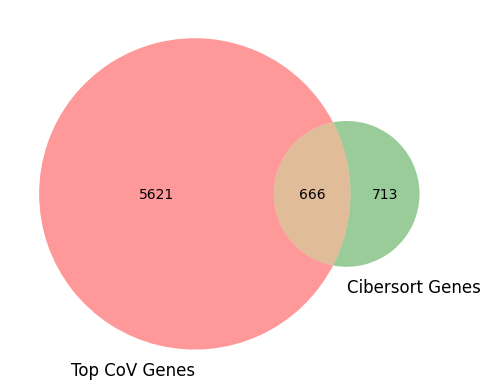

In [22]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [23]:
union_genes = np.union1d(gene_df, cibersort_genes)
#union_genes = gene_df
len(union_genes)

7000

In [24]:
np.isin("IL6", union_genes)

array(True)

In [25]:
X_full = X_full.loc[:,union_genes]


In [26]:
# check quantile estimates

print(np.quantile(X_full, 0.9))
print(np.quantile(X_full.iloc[sc_idx], 0.9))
print(np.quantile(X_full.iloc[bulk_idx], 0.9))


467.0
428.0
4943.0


In [27]:
# check correlation between bulk and single cell
sc_check = sc_idx[0]
bulk_check = bulk_idx[0]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

bulk_check = bulk_idx[1]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[2]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[5]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[12]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

[[1.         0.32183091]
 [0.32183091 1.        ]]
[[1.         0.41225229]
 [0.41225229 1.        ]]
[[1.         0.32722257]
 [0.32722257 1.        ]]
[[1.         0.38797092]
 [0.38797092 1.        ]]
[[1.         0.46314237]
 [0.46314237 1.        ]]


In [28]:
# check correlation within bulk
bulk_check0 = bulk_idx[0]
bulk_check1 = bulk_idx[1]

print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

bulk_check1 = bulk_idx[1]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[2]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[5]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[12]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

[[1.         0.31148076]
 [0.31148076 1.        ]]
[[1.         0.31148076]
 [0.31148076 1.        ]]
[[1.         0.36034088]
 [0.36034088 1.        ]]
[[1.         0.40820637]
 [0.40820637 1.        ]]
[[1.         0.55583719]
 [0.55583719 1.        ]]


In [29]:
# check correlation within sc
sc_check0 = sc_idx[0]
sc_check1 = sc_idx[5000]

print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

sc_check1 = sc_idx[1]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[2]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[5]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[12]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

[[1.         0.77337052]
 [0.77337052 1.        ]]
[[1.         0.99558421]
 [0.99558421 1.        ]]
[[1.         0.99793661]
 [0.99793661 1.        ]]
[[1.        0.9986205]
 [0.9986205 1.       ]]
[[1.         0.99754827]
 [0.99754827 1.        ]]


# Normalize data

In [30]:
X_full = X_full.loc[:,union_genes]

# rescale sc_ref and bulks
median_sc_ref = np.median(np.quantile(X_full.iloc[sc_idx], axis=1, q=0.9))
median_bulk = np.median(np.quantile(X_full.iloc[bulk_idx], axis=1, q=0.9))

ratio_medians = median_bulk/median_sc_ref

X_full.iloc[sc_idx] = X_full.iloc[sc_idx]*ratio_medians


In [31]:
ratio_medians

11.499277108433736

In [32]:
# check quantile estimates

print(np.quantile(X_full, 0.9))
print(np.quantile(X_full.iloc[sc_idx], 0.9))
print(np.quantile(X_full.iloc[bulk_idx], 0.9))


4921.690602409639
4921.690602409639
4943.0


In [33]:

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()


In [34]:
# check correlation between bulk and single cell
sc_check = sc_idx[0]
bulk_check = bulk_idx[0]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))

bulk_check = bulk_idx[1]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))


bulk_check = bulk_idx[2]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))


bulk_check = bulk_idx[5]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))


bulk_check = bulk_idx[12]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))

[[1.         0.23696879]
 [0.23696879 1.        ]]
[[1.         0.39292466]
 [0.39292466 1.        ]]
[[1.         0.36891338]
 [0.36891338 1.        ]]
[[1.         0.33951469]
 [0.33951469 1.        ]]
[[1.         0.23733053]
 [0.23733053 1.        ]]


In [35]:
# check correlation within bulk
bulk_check0 = bulk_idx[0]
bulk_check1 = bulk_idx[1]

print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))

bulk_check1 = bulk_idx[1]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))


bulk_check1 = bulk_idx[2]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))


bulk_check1 = bulk_idx[5]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))


bulk_check1 = bulk_idx[12]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))

[[1.         0.13072266]
 [0.13072266 1.        ]]
[[1.         0.13072266]
 [0.13072266 1.        ]]
[[1.         0.33129241]
 [0.33129241 1.        ]]
[[1.         0.35649769]
 [0.35649769 1.        ]]
[[1.         0.21363271]
 [0.21363271 1.        ]]


In [36]:
# check correlation within sc
sc_check0 = sc_idx[0]
sc_check1 = sc_idx[5000]

print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))

sc_check1 = sc_idx[1]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))


sc_check1 = sc_idx[2]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))


sc_check1 = sc_idx[5]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))


sc_check1 = sc_idx[12]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))

[[1.         0.61258103]
 [0.61258103 1.        ]]
[[1.         0.97110444]
 [0.97110444 1.        ]]
[[1.         0.97848177]
 [0.97848177 1.        ]]
[[1.         0.98453847]
 [0.98453847 1.        ]]
[[1.         0.98267095]
 [0.98267095 1.        ]]


# Plot all data

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.013s...
[t-SNE] Computed neighbors for 10000 samples in 6.884s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.139485
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.761955
[t-SNE] KL divergence after 500 iterations: 1.393959
(10000, 2)
(10000, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_2992/1731503276.py:24: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


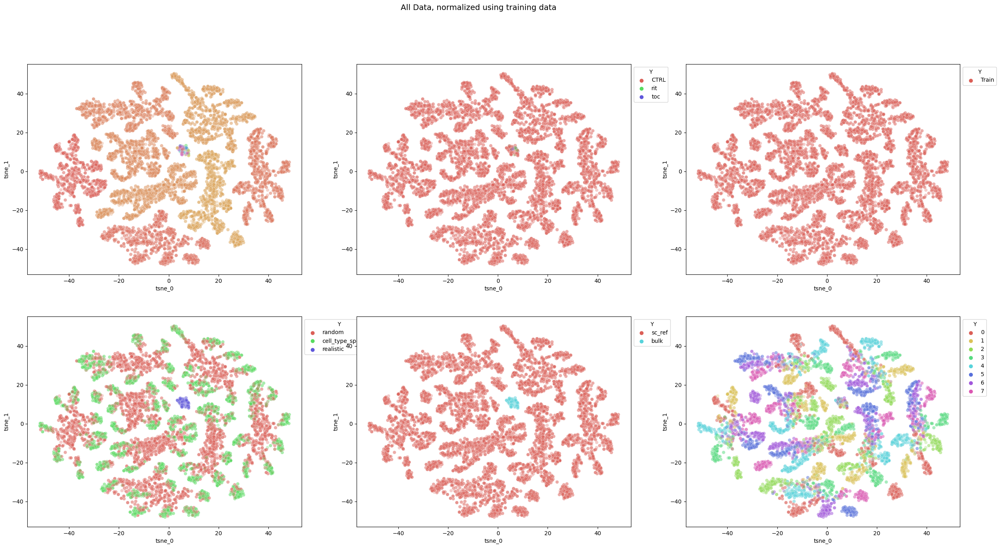

In [37]:
## plot samples
idx_tmp = np.random.choice(range(X_full.shape[0]), 10000, replace=True)


plot_df = vp.get_tsne_for_plotting(X_full[idx_tmp,])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_tmp])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(173, 2)
(173, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_2992/119314534.py:23: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


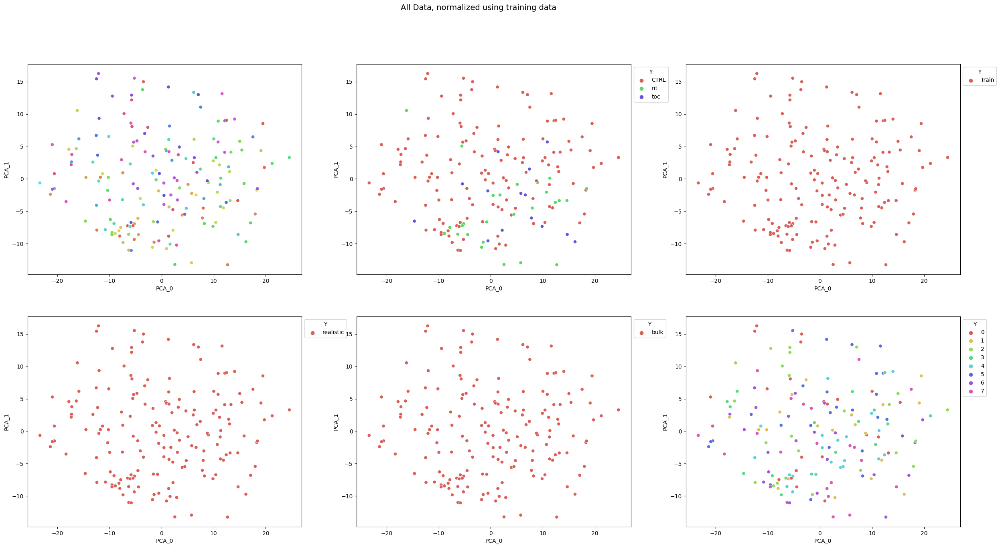

In [38]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 173 samples in 0.001s...
[t-SNE] Computed neighbors for 173 samples in 0.017s...
[t-SNE] Computed conditional probabilities for sample 173 / 173
[t-SNE] Mean sigma: 6.229199
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.503918
[t-SNE] KL divergence after 500 iterations: 0.584666
(173, 2)
(173, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_2992/614891228.py:23: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


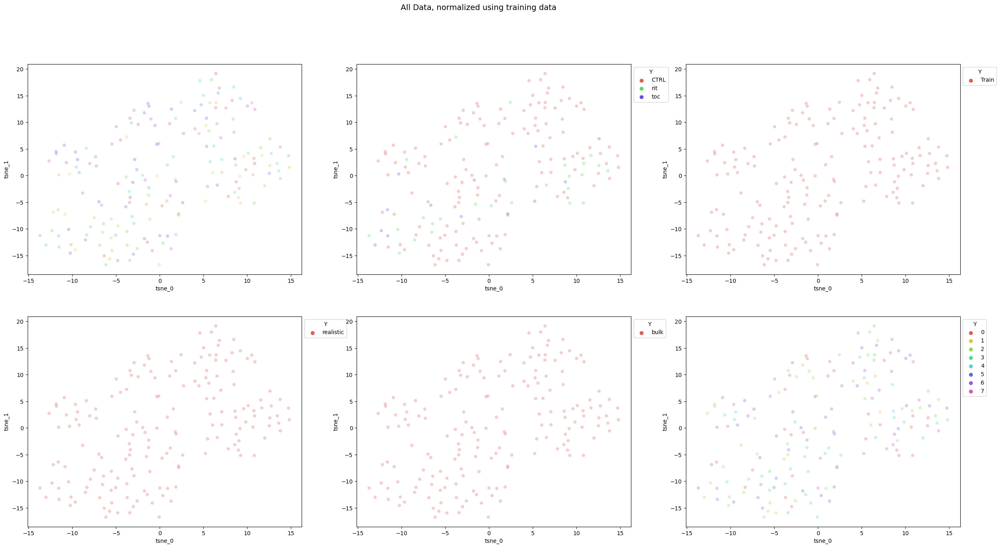

In [39]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Run BuDDI**

# **Results**

Looking at all the results, we see that 200 epochs and weight of 100 gets the lowest reconstruction error and performs reasonably well in estimating the cell-type proportions.

**log10 reconstruction error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 3.49 | 3.45 | **3.25** |
| 1000 | 3.94 | 3.83 | 3.59 |
| 10000 | 4.30 | 4.38 | 5.07 |


**spearman error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 0.69 | 0.71 | 0.76 |
| 1000 | 0.655 | 0.71 | **0.77** |
| 10000 | 0.654 | 0.38 | 0.76 |


2024-02-20 21:20:01.150053: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:375] MLIR V1 optimization pass is not enabled
2024-02-20 21:20:01.166380: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_bulk/kernel/Assign' id:273 op device:{requested: '', assigned: ''} def:{{{node mu_bulk/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](mu_bulk/kernel, mu_bulk/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-20 21:20:01.382511: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack/truediv/y' id:387 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was change

test_size_samp: 500
train_size_samp: 14500


2024-02-20 21:20:02.240410: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/decoder_out/bias/m/Assign' id:2262 op device:{requested: '', assigned: ''} def:{{{node training/Adam/decoder_out/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/decoder_out/bias/m, training/Adam/decoder_out/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-20 21:20:03.048364: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_1/AddN' id:1183 op device:{requested: '', assigned: ''} def:{{{node loss_1/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_1/mul, loss_1/mul_1, loss_1/mul_2, loss_1/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and wi

Elapsed:  2838.345494031906
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model1_rittoc-synovium_classifier/assets


2024-02-20 22:07:30.744765: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_26' id:5198 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_26}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_2, Identity_630)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 22:07:31.435012: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_59' id:5599 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_59}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_18, Identity_663)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 22:07:31.761763: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_66' id:5759 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_66}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_24, Identity_670)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 22:07:32.046284: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_72' id:5848 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_72}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_27, Identity_676)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


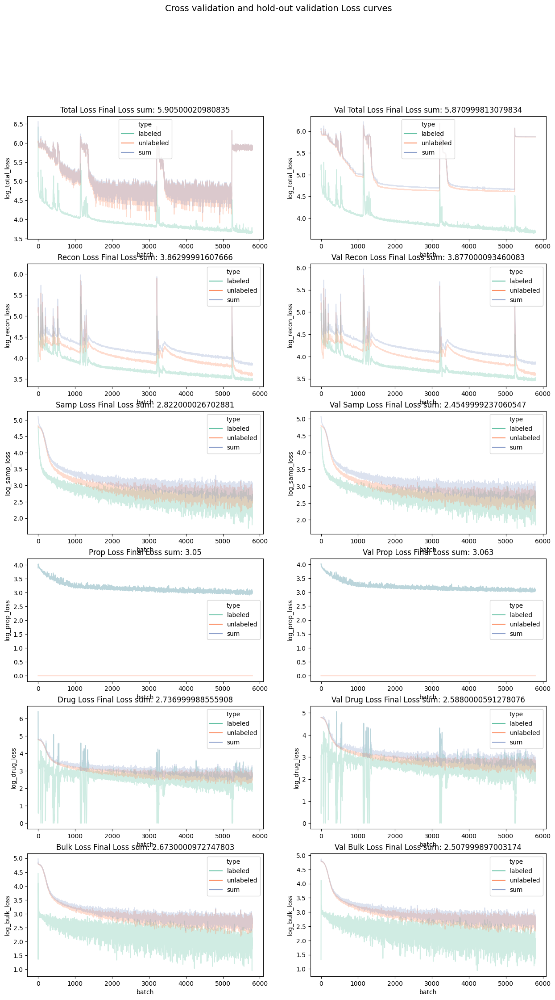

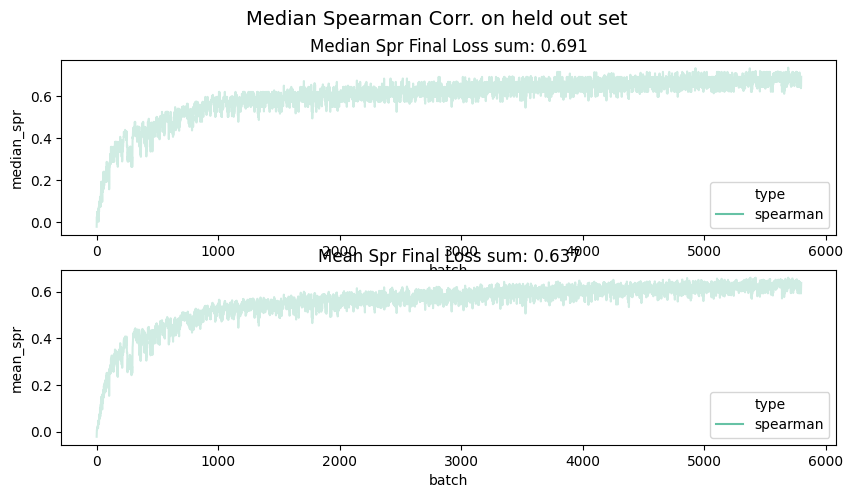

In [40]:
curr_n_epoch=200
curr_wt = 100

params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt,
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)#, n_label_z=10,
            #encoder_dim=32, decoder_dim=32)

## model 1
curr_res_id = f"pred3_rittoc_model1_{res_id}"
res1 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model1_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model1_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model1_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model1_{res_id}_classifier")



2024-02-20 22:07:34.019868: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_bulk_3/bias/Assign' id:5971 op device:{requested: '', assigned: ''} def:{{{node encoder_bulk_3/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_bulk_3/bias, encoder_bulk_3/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-20 22:07:34.358173: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_1/truediv/y' id:6242 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_1/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the futu

test_size_samp: 500
train_size_samp: 14500


2024-02-20 22:07:37.051289: W tensorflow/c/c_api.cc:304] Operation '{name:'training_4/Adam/sigma_slack_3/bias/v/Assign' id:8152 op device:{requested: '', assigned: ''} def:{{{node training_4/Adam/sigma_slack_3/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_4/Adam/sigma_slack_3/bias/v, training_4/Adam/sigma_slack_3/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-20 22:07:39.447411: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_3/AddN' id:7038 op device:{requested: '', assigned: ''} def:{{{node loss_3/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_3/mul, loss_3/mul_1, loss_3/mul_2, loss_3/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have n

Elapsed:  2888.3975219726562
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model2_rittoc-synovium_classifier/assets


2024-02-20 22:55:54.818813: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_96' id:11004 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_96}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_30, Identity_1304)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 22:55:55.671504: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_124' id:11395 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_124}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_52, Identity_1332)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 22:55:56.187404: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_144' id:11581 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_144}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_54, Identity_1352)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 22:55:56.674278: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_150' id:11670 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_150}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_57, Identity_1358)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


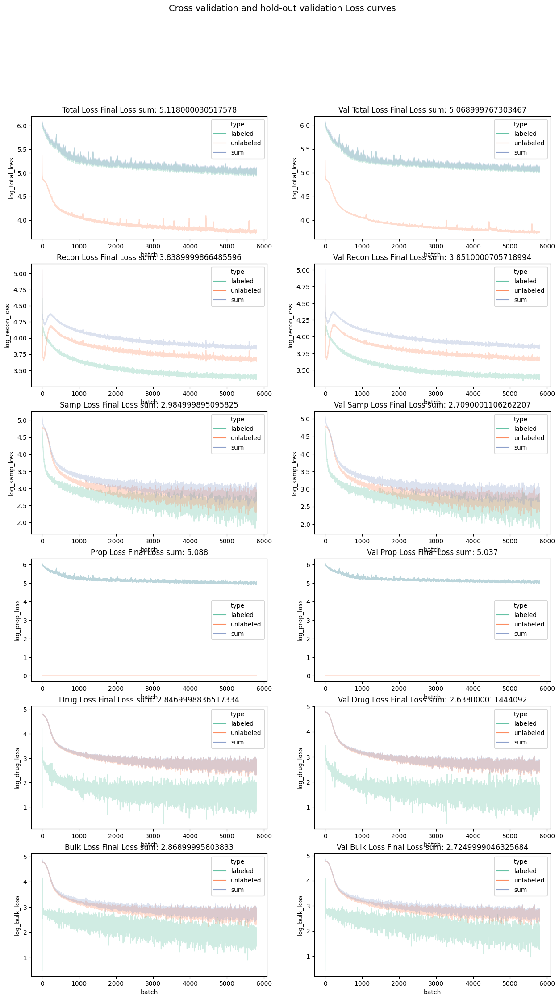

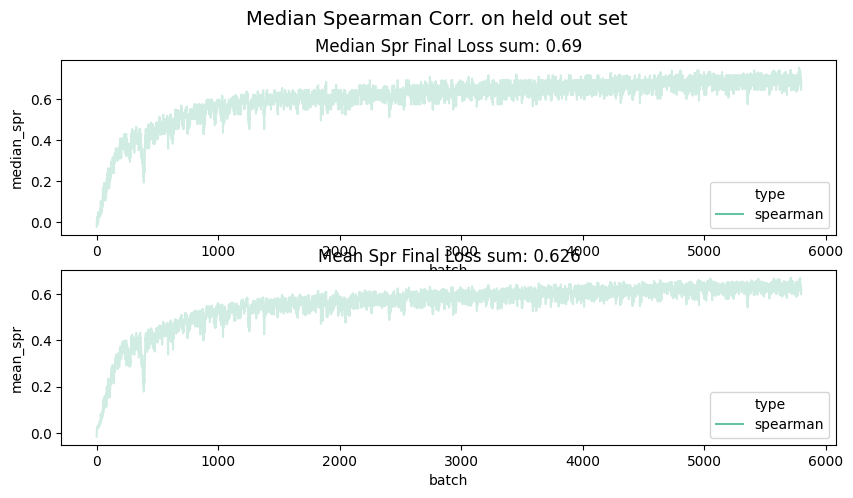

In [41]:
curr_n_epoch=200
curr_wt = 100

params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt*100,
            alpha_bulk=curr_wt, alpha_drug=curr_wt)#, n_label_z=10,
            #encoder_dim=32, decoder_dim=32)

## model 1
curr_res_id = f"pred3_rittoc_model2_{res_id}"
res1 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model2_{res_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model2_{res_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model2_{res_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model2_{res_id}_classifier")



2024-02-20 22:55:58.723226: W tensorflow/c/c_api.cc:304] Operation '{name:'sigma_drug_6/kernel/Assign' id:11923 op device:{requested: '', assigned: ''} def:{{{node sigma_drug_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](sigma_drug_6/kernel, sigma_drug_6/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-20 22:55:59.199828: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_2/truediv/y' id:12060 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_2/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger

test_size_samp: 500
train_size_samp: 14500


2024-02-20 22:56:02.626786: W tensorflow/c/c_api.cc:304] Operation '{name:'training_8/Adam/mu_bulk_6/bias/v/Assign' id:14054 op device:{requested: '', assigned: ''} def:{{{node training_8/Adam/mu_bulk_6/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_8/Adam/mu_bulk_6/bias/v, training_8/Adam/mu_bulk_6/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-20 22:56:04.930313: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_5/AddN' id:12856 op device:{requested: '', assigned: ''} def:{{{node loss_5/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_5/mul, loss_5/mul_1, loss_5/mul_2, loss_5/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and 

Elapsed:  2757.8454473018646
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//pred3_rittoc_model3_rittoc-synovium_classifier/assets


2024-02-20 23:42:10.908408: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_193' id:16864 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_193}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_67, Identity_2005)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:11.971200: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_194' id:17201 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_194}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_70, Identity_2006)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:12.709870: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_219' id:17397 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_219}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_82, Identity_2031)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:13.414242: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_226' id:17488 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_226}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_86, Identity_2038)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


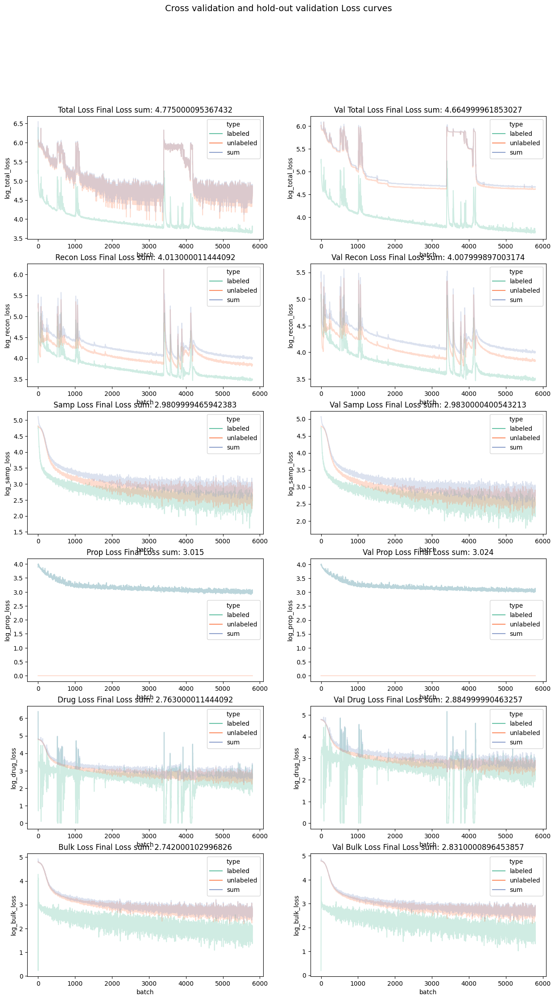

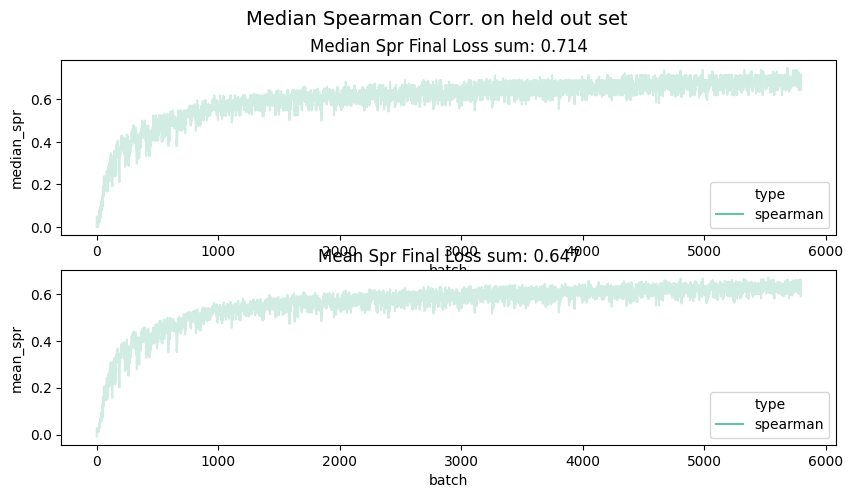

In [42]:
curr_n_epoch=200
curr_wt = 100

params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt,
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)#, n_label_z=10,
            #encoder_dim=32, decoder_dim=32)

## model 1
curr_res_id = f"pred3_rittoc_model3_{res_id}"
res1 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model3_{res_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model3_{res_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model3_{res_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model3_{res_id}_classifier")



In [43]:
curr_n_epoch=200
curr_wt = 100

if RETRAIN_MODELS: # RETRAIN_MODELS


    params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
                alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
                alpha_bulk=curr_wt, alpha_drug=curr_wt)

    ## model 1
    curr_res_id = f"model1_{res_id}"
    res1 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 2
    curr_res_id = f"model2_{res_id}"
    res2 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 3
    curr_res_id = f"model3_{res_id}"
    res3 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model1_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model1_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model1_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model1_{res_id}_classifier")


res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model2_{res_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model2_{res_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model2_{res_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model2_{res_id}_classifier")


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model3_{res_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model3_{res_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model3_{res_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/pred3_rittoc_model3_{res_id}_classifier")

2024-02-20 23:42:15.908963: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_250' id:17791 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_250}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_96, Identity_2062)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:17.815685: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_256' id:18138 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_256}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_109, Identity_2068)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:18.750221: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_277' id:18326 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_277}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_111, Identity_2089)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:19.578708: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_281' id:18411 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_281}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_113, Identity_2093)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:20.828959: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_299' id:18702 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_299}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_120, Identity_2111)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:22.168423: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_330' id:19099 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_330}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_136, Identity_2142)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:23.159267: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_335' id:19255 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_335}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_140, Identity_2147)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:24.083369: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_339' id:19340 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_339}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_142, Identity_2151)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:25.400055: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_358' id:19633 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_358}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_150, Identity_2170)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:26.821599: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_369' id:19990 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_369}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_157, Identity_2181)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:27.910700: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_393' id:20184 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_393}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_169, Identity_2205)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-20 23:42:28.924511: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_400' id:20275 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_400}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_173, Identity_2212)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


## visualize latent spaces

### subset data

In [44]:
# subset the data to the training data
# to show our latent spaces are learning appropriately

idx_tmp_bulk = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
idx_tmp_bulk = np.random.choice(idx_tmp_bulk, 5000, replace=True)


idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type != "realistic"))[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)
idx_tmp = np.concatenate((idx_tmp, idx_tmp_bulk))

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]
perturb_temp = index_drug[perturb_temp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]


### plot data

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-20 23:42:31.608682: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack/add_2/z_samp_slack/add' id:17866 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack/add_2/z_samp_slack/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_9/BiasAdd, tf_op_layer_z_samp_slack/mul_2/z_samp_slack/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-20 23:42:32.950193: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out_6/So

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


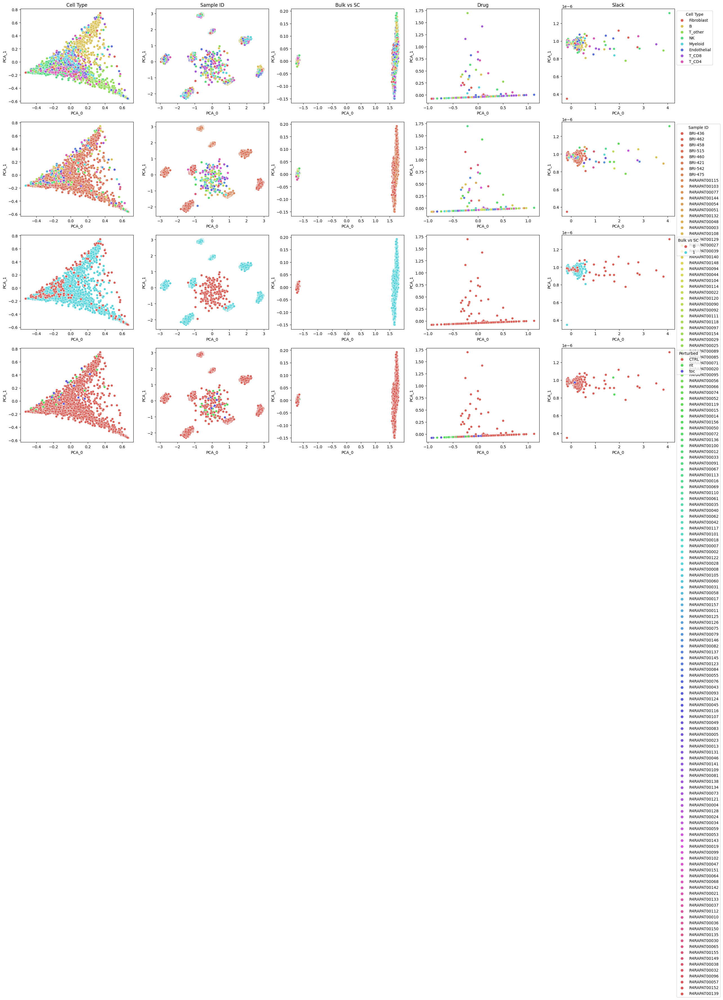

In [45]:

res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=False, use_pca=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-20 23:42:44.383758: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_1/add_2/z_samp_slack_1/add' id:18795 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_1/add_2/z_samp_slack_1/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_11/BiasAdd, tf_op_layer_z_samp_slack_1/mul_2/z_samp_slack_1/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-20 23:42:46.104730: W tensorflow/c/c_api.cc:304] Operation '{name:

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


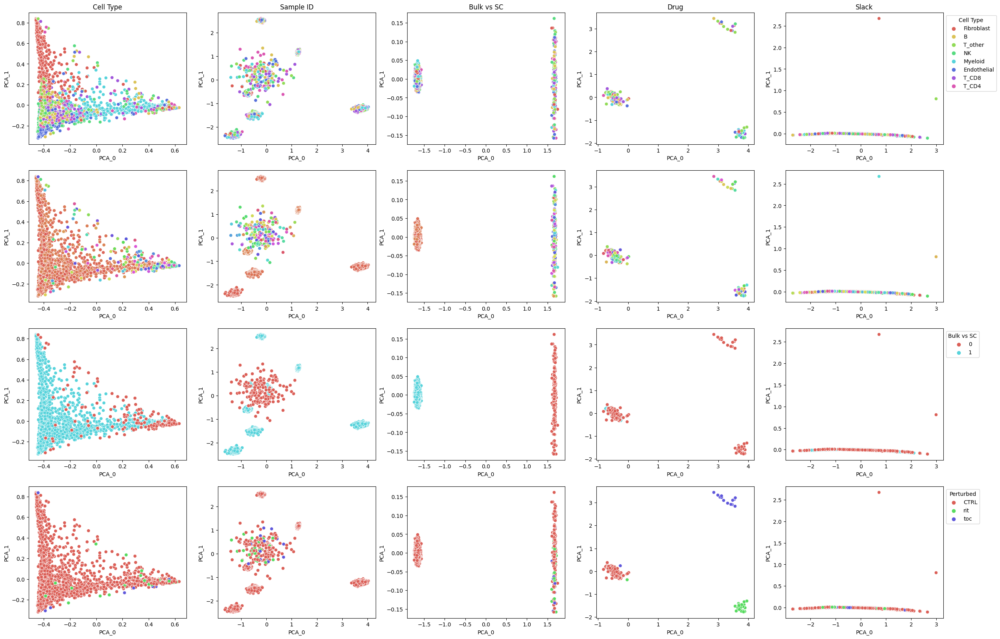

In [46]:

res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-20 23:42:55.978557: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_2/add_2/z_samp_slack_2/add' id:19724 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_2/add_2/z_samp_slack_2/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_13/BiasAdd, tf_op_layer_z_samp_slack_2/mul_2/z_samp_slack_2/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-20 23:42:57.364150: W tensorflow/c/c_api.cc:304] Operation '{name:

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


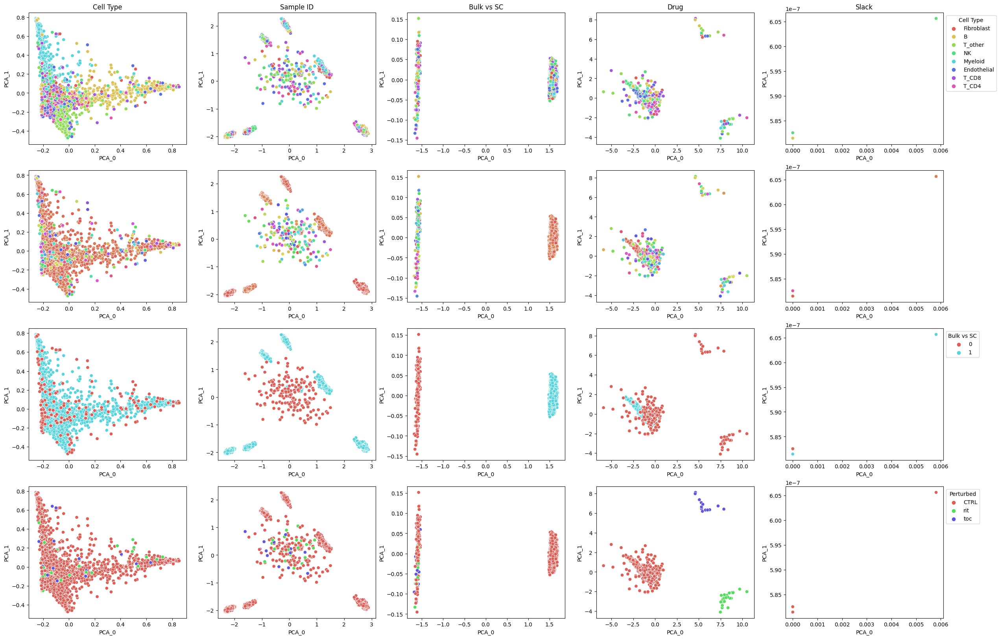

In [47]:

res3_latent_plot = buddi.plot_latent_spaces(res3_enc_unlab, res3_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

## visualize reconstruction

### subset data

In [48]:
# take all training data

recon_idx = np.where(np.logical_and(meta_df.cell_prop_type == "realistic", meta_df.isTraining == "Train"))[0]
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 1000, replace=True)

# subset our data

meta_temp = meta_df.iloc[recon_idx]

X_temp = np.copy(X_full[recon_idx])

Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_full.columns[Y_temp]


label_temp = np.copy(Label_full[recon_idx])
label_temp = index_label[label_temp]

perturb_temp = Drug_full[recon_idx]




### plot data

In [49]:
Y_full.iloc[recon_idx]

,NK,B,Endothelial,Fibroblast,Myeloid,T_CD8,T_CD4,T_other
0,0.110,0.050,0.030,0.300,0.040,0.125,0.045,0.300
0,0.005,0.005,0.005,0.465,0.305,0.190,0.005,0.020
0,0.005,0.045,0.870,0.005,0.005,0.050,0.015,0.005
0,0.010,0.020,0.040,0.010,0.040,0.820,0.005,0.055
0,0.220,0.035,0.140,0.085,0.050,0.250,0.125,0.095
...,...,...,...,...,...,...,...,...
0,0.040,0.075,0.055,0.470,0.190,0.050,0.015,0.105
0,0.005,0.575,0.015,0.020,0.010,0.265,0.105,0.005
0,0.135,0.005,0.470,0.035,0.005,0.295,0.025,0.030
0,0.220,0.035,0.140,0.085,0.050,0.250,0.125,0.095


/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-20 23:43:07.557232: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_12/Sigmoid' id:18340 op device:{requested: '', assigned: ''} def:{{{node decoder_out_12/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_12/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


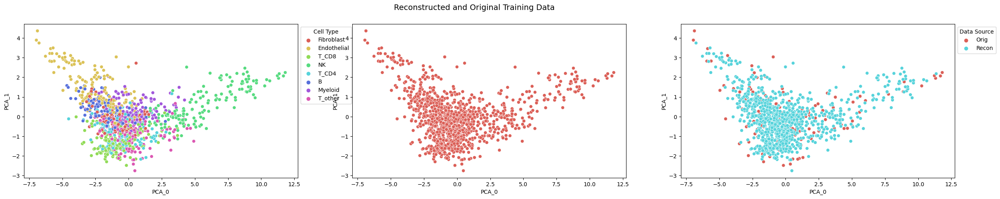

In [50]:
res1_recon_plot = buddi.plot_reconstruction_buddi(res1_enc_unlab, res1_classifier, res1_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-20 23:43:09.087801: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_13/Sigmoid' id:19269 op device:{requested: '', assigned: ''} def:{{{node decoder_out_13/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_13/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


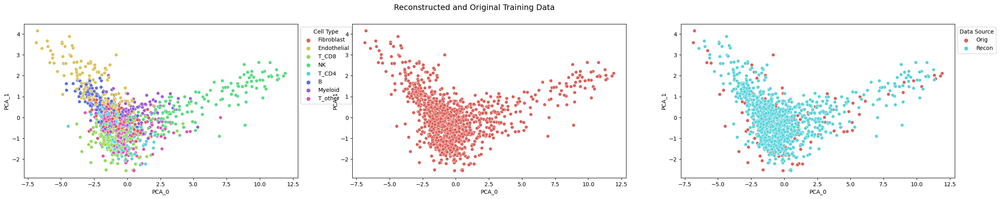

In [51]:
res2_recon_plot = buddi.plot_reconstruction_buddi(res2_enc_unlab, res2_classifier, res2_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-20 23:43:10.569499: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_14/Sigmoid' id:20198 op device:{requested: '', assigned: ''} def:{{{node decoder_out_14/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_14/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


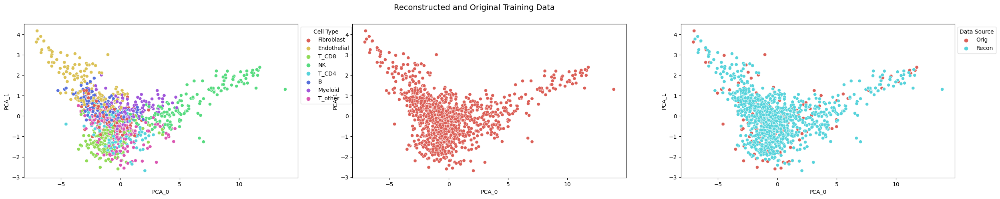

In [52]:
res3_recon_plot = buddi.plot_reconstruction_buddi(res3_enc_unlab, res3_classifier, res3_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)